<a href="https://colab.research.google.com/github/cappelchi/Modeling-Precision-Medicine/blob/master/Modeling_Precision_Medicine_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#<u>Content</u>:

[- Task](#scrollTo=hnkyl0KK7EBE)

[- Background](#scrollTo=5okWuAiR7LkR)

[- Some installations, setup and predifinitions](#scrollTo=bqX0DAWm4oNB)

[- Results and discussion](#scrollTo=oJjFVIGF8NsR)

## Task

Below are links to the raw gene expression table resulting from the RNA-seq pipeline, as well as the unprocessed drug efficacy table. The large number of samples adds potential for more discovery. You may use your own tools, or those available on the T-BioInfo platform.

Data: CellLines_Student_ProjectData

The files contained in the zipped folder are:

CellLines_ClinSubtypes.txt – a list of the samples with their known PAM50 subtypes

CellLines_ExprData.txt – expression data from the RNA-seq pipeline as detailed in section 3; 52 breast cancer samples

CellLines_DrugsInit.txt – unprocessed drug efficacy (GI50) table; missing data

CellLines_DrugsRes.txt – process drug efficacy (GI50) table; missing data approximated.


**Results** should be presented in the format of a poster. See the template below, which contains important sections to include.

*Background*: Biological/computational concepts and problem statement

*Methods*: Experimental design, samples and data types, pipelines

*Results and Discussion*: Statistical conclusions, key findings (genes, etc.), biological interpretation, limitations to the analysis, future research

*Conclusion*: Short summary of results
References

The same sections are typically used in a research paper. Following these guidelines you would be ready to present your results.

**Prediction of the most effective therapeutic agent, given the expression data from a tumor sample.*** 

This could be done by assigning to each sample it’s most effective therapeutic agent (from the Gi50 data) as its “class”, then using a model in the supervised analysis section to learn to “classify” the data.
Using supervised analysis modules that perform feature selection (such as swLDA or RandForest), to determine which genes are most informative for predicting best therapeutic agent.
Performing more extensive clustering analysis to determine distinct breast cancer sub-types based on gene or isoform expression.
[Modeling precision treatment of breast cancer](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC3937590/)

[Биологические принципы метастазирования](https://medach.pro/post/2267)

Associated Publication and Dataset
The course uses data presented by Daemen et al. (Modeling precision treatment of breast cancer, Genome Biol. 2013. The researchers tested 90 therapeutic compounds on 70 breast cancer cell lines (out of 84 lines comprising their collection) and determined GI50 — concentrations required to inhibit cell growth by 50%. GI50 can be treated as a measure of efficacy of a given compound for a given breast cancer cell line. In addition to a table with GI50 values, Daemen et al. deposited results of RNA-Seq (GSE4821) for 56 cell lines, including 52 for which GI50 data was also available. Finally, the authors specified an associated breast cancer subtype for each cell line. For this course, we will be using data from those 52 cell lines for which GI50 data was available.



##Background


Breast cancer is a clinically and genomically heterogeneous disease. Six subtypes (4 in our dataset) were defined approximately a decade ago based on transcriptional characteristics and were designated luminal A, luminal B, basal-like, claudin-low and normal-like.
In breast cancer, cell lines mirror many of the molecular characteristics of the tumors from which they were derived, and are therefore a useful preclinical model in which to explore strategies for predictive marker development.

##Some installations, setup and predifinitions

In [0]:
#!pip install umap-learn
#!pip install pycaret
#!pip install pandas-profiling
#!pip install nxviz

In [0]:
import sys
import pandas as pd
from tqdm import tqdm
from scipy.stats import pearsonr
import matplotlib.pyplot as plt
%matplotlib inline

In [0]:
import plotly.graph_objects as go
import plotly.figure_factory as ff
def enable_plotly_in_cell():
  import IPython
  from plotly.offline import init_notebook_mode
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
  '''))
  init_notebook_mode(connected=False)

In [0]:
from sklearn.decomposition import PCA
from sklearn.metrics import confusion_matrix
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from itertools import cycle
import warnings
from umap import UMAP

In [0]:
import networkx as nx

In [6]:
!test -d Modeling-Precision-Medicine || git clone https://github.com/cappelchi/Modeling-Precision-Medicine.git
if not 'Modeling-Precision-Medicine' in sys.path:
  sys.path += ['Modeling-Precision-Medicine']
!ls Modeling-Precision-Medicine

Cloning into 'Modeling-Precision-Medicine'...
remote: Enumerating objects: 9, done.
remote: Counting objects: 100% (9/9), done.
remote: Compressing objects: 100% (9/9), done.
remote: Total 115 (delta 4), reused 0 (delta 0), pack-reused 106
Receiving objects: 100% (115/115), 27.44 MiB | 9.94 MiB/s, done.
Resolving deltas: 100% (48/48), done.
CellLines_ClinSubtypes.txt	   img				      models
CellLines_Student_ProjectData.zip  Modeling_Precision_Medicine.ipynb  README.md


In [0]:
mypath = '/content/Modeling-Precision-Medicine/'

In [8]:
#!wget https://raw.githubusercontent.com/cappelchi/Modeling-Precision-Medicine/master/CellLines_Student_ProjectData.zip
!unzip /content/Modeling-Precision-Medicine/CellLines_Student_ProjectData.zip -d {mypath}

Archive:  /content/Modeling-Precision-Medicine/CellLines_Student_ProjectData.zip
   creating: /content/Modeling-Precision-Medicine/CellLines_Student_ProjectData/
  inflating: /content/Modeling-Precision-Medicine/CellLines_Student_ProjectData/CellLines_ClinSubtypes.txt  
   creating: /content/Modeling-Precision-Medicine/__MACOSX/
   creating: /content/Modeling-Precision-Medicine/__MACOSX/CellLines_Student_ProjectData/
  inflating: /content/Modeling-Precision-Medicine/__MACOSX/CellLines_Student_ProjectData/._CellLines_ClinSubtypes.txt  
  inflating: /content/Modeling-Precision-Medicine/CellLines_Student_ProjectData/CellLines_DrugsInit.txt  
  inflating: /content/Modeling-Precision-Medicine/__MACOSX/CellLines_Student_ProjectData/._CellLines_DrugsInit.txt  
  inflating: /content/Modeling-Precision-Medicine/CellLines_Student_ProjectData/CellLines_DrugsRes.txt  
  inflating: /content/Modeling-Precision-Medicine/__MACOSX/CellLines_Student_ProjectData/._CellLines_DrugsRes.txt  
  inflating: /c

In [0]:
from os import listdir
from os.path import isfile, join
import codecs
import numpy as np
#from pandas_profiling import ProfileReport

In [0]:
def pca_visualization(df, smallg = False, model_class = [], chart_studio = False, chart_name = 'Modeling Breast Cancer Precision Medicine' ):
    enable_plotly_in_cell()
    trs = df.columns[-1]
    annotations =[]
    if model_class:
        add_cls = 1
        df = df.join(pd.DataFrame(model_class, columns = ['model'], index = df.index), how = 'outer')
    else:
        df['model'] = df[trs]
    df = df.sort_values(by = trs)
    for n in df.index:
        if df.loc[n, trs] != df.loc[n, 'model']:
            annotations.append(dict(
                x = n,
                y = 0,
                xref = 'x',
                yref = 'y',
                text = df.loc[n, 'model'],
                textangle = 90,
                bgcolor = 'rgb(255, 0, 0)',
                font = dict(color = 'rgb(255, 255 , 255)'),
                showarrow = True,
                arrowhead = 7,
                ax = 0,
                ay = 40
            ))                
        elif (df.loc[n, trs] == 'Normal-like') or (df.loc[n, trs] == 'Claudin-low'):
            if smallg:
                annotations.append(dict(
                    x = n,
                    y = 0,
                    xref = 'x',
                    yref = 'y',
                    text = df.loc[n, trs],
                    textangle = 90,
                    showarrow = True,
                    arrowhead = 7,
                    ax = 0,
                    ay = 40
                )) 
    fig = go.Figure()

    for comp in df.columns[:-2]:
        fig.add_trace(go.Bar(
            x = df.index, # + df.sort_values(by = 'Transcriptional_subtype').Transcriptional_subtype,
            y = df.loc[:,comp] - df.loc[:,comp].min(),
            name = comp, 
            text = df[trs]
        ))
    fig.update_layout(barmode='stack',
                        title=dict(
                            text = '<br><i>Gene Expression</i>',
                            y = 0.95,
                            x = 0.5,
                            xanchor = 'center',
                            yanchor = 'top'
                                ),
                        height = 750,
                        width = 1000,
                        annotations = annotations
                        )
    fig.show()
    if chart_studio:
        studio.plot(fig, filename = chart_name, auto_open=True)

In [0]:
def plot_umap (df_umap, n_neighbors = 10, min_dist = 0.1, n_components = 2, 
               verbose = False, width = 1000, height = 800):
    enable_plotly_in_cell()
    model = UMAP(n_neighbors = n_neighbors, 
                 min_dist = min_dist, 
                 n_components = n_components, 
                 verbose = verbose)
    umap = model.fit_transform(df_umap.iloc[:,:-1])
    label_encoder = preprocessing.LabelEncoder()
    fig = go.Figure(data=go.Scatter(
        x=umap[:, 0],
        y=umap[:, 1],
        mode='markers',
        hovertext = df_umap.iloc[:,-1],
        marker=dict(
                    size=10,
                    color = label_encoder.fit_transform(df_umap.iloc[:,-1]) + 1
                    )
    ))
    fig.update_layout(width = width,
                    height = height,
                    title=dict(
                        text = '<br><i>UMAP of full gene expression</i>',
                        y = 0.95,
                        x = 0.5,
                        xanchor = 'center',
                        yanchor = 'top'
                            ),
                    xaxis = dict(
                        title = '<br> Colors: orange - Luminal, blue - Basal, Violet - Claudin-low, yellow - Normal-like'
                                )

                    )
    fig.show()

[code PCA rank](https://github.com/gaurav-kaushik/Data-Visualizations-Medium/blob/master/code/Interactive_PCA_and_Feature_Correlation.ipynb)

[Article](https://medium.com/cascade-bio-blog/creating-visualizations-to-better-understand-your-data-and-models-part-1-a51e7e5af9c0)

In [0]:
def pca_report_interactive(X, scale_X:bool=True, save_plot:bool=False):
    """
    X:          input data matrix
    scale_X:    determine whether to rescale X (StandardScaler) [default: True, X is not prescaled
    save_plot:  save plot to file (html) and not show
    """

    # calculate mean and var
    X_mean, X_var = X.mean(), X.var()
    #print('\n*--- PCA Report ---*\n')
    #print(f'X mean:\t\t{X_mean:.3f}\nX variance:\t{X_var:.3f}')

    if scale_X:
        # rescale and run PCA
        print("\n...Rescaling data...\n")
        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X)
        X_s_mean, X_s_var = X_scaled.mean(), X_scaled.var()
        print(f'X_scaled mean:\t\t{np.round(X_s_mean):.3f}')
        print(f'X_scaled variance:\t{np.round(X_s_var):.3f}\n')
        pca_ = PCA().fit(X_scaled)
        X_pca = PCA().fit_transform(X)
    else:
        # run PCA directly
        print("...Assuming data is properly scaled...")
        pca_ = PCA().fit(X)
        X_pca = PCA().fit_transform(X)
            
    # Get cumulative explained variance for each dimension
    pca_evr = pca_.explained_variance_ratio_
    cumsum_ = np.cumsum(pca_evr)
    
    # Get dimensions where var >= 95% and values for variance at 2D, 3D
    dim_95 = np.argmax(cumsum_ >= 0.95) + 1
    twoD = np.round(cumsum_[1], decimals=3)*100 
    threeD = np.round(cumsum_[2], decimals=3)*100
    instances_, dims_ =  X.shape
    
    # check shape of X
    if dims_ > instances_:
        print("WARNING: number of features greater than number of instances.")
        dimensions = list(range(1, instances_+1))
    else:
        dimensions = list(range(1, dims_+1))
    
    # Print report
    print("\n -- Summary --")
    print(f"You can reduce from {dims_} to {dim_95} dimensions while retaining 95% of variance.")
    print(f"2 principal components explain {twoD:.2f}% of variance.")
    print(f"3 principal components explain {threeD:.2f}% of variance.")
        # output PCA info as a dataframe
    df_PCA = pd.DataFrame({'dimension': dimensions, 'variance_cumulative': cumsum_, 'variance': pca_evr}).set_index(['dimension'])
        
    return df_PCA, X_pca, pca_evr

In [0]:
def pca_feature_correlation(X, X_pca, explained_var, features:list=None, fig_dpi:int=150, save_plot:bool=False):
    """
    1. Get dot product of X and X_pca
    2. Run normalizations of X*X_pca
    3. Retrieve df/matrices

    X:               data (numpy matrix)
    X_pca:           PCA
    explained_var:   explained variance matrix
    features:        list of feature names
    fig_dpi:         dpi to use for heatmaps
    save_plot:       save plot to file (html) and not show
    """
    
    # Add zeroes for data where features > instances
    outer_diff = X.T.shape[0] - X_pca.shape[1]
    if outer_diff > 0: # outer dims must match to get sq matrix
        Z = np.zeros([X_pca.shape[0], outer_diff])
        X_pca = np.c_[X_pca, Z]
        explained_var = np.append(explained_var, np.zeros(outer_diff))
    
    # Get correlation between original features (X) and PCs (X_pca)
    dot_matrix = np.dot(X.T, X_pca)
    #print(f"X*X_pca: {X.T.shape} * {X_pca.shape} = {dot_matrix.shape}")
    
    # Correlation matrix -> df
    df_dotproduct = pd.DataFrame(dot_matrix)
    df_dotproduct.columns = [''.join(['PC', f'{i+1}']) for i in range(dot_matrix.shape[0])]
    if any(features): df_dotproduct.index = features    
    
    # Normalize & Sort
    df_n, df_na, df_nabv = normalize_dataframe(df_dotproduct, explained_var, plot_opt=True, save_plot=save_plot)
    
    return df_dotproduct, df_n, df_na, df_nabv

In [0]:
def normalize_dataframe(df, explained_var=None, fig_dpi:int=150, plot_opt:bool=True, save_plot:bool=False):
    """
    1. Get z-normalized df (normalized to µ=0, σ=1)
    2. Get absolute value of z-normalized df
    3. If explained_variance matrix provided, dot it w/ (2)
    """
    # Normalize, Reindex, & Sort
    df_norm = (df.copy()-df.mean())/df.std()
    df_norm = df_norm.sort_values(list(df_norm.columns), ascending=False)
    
    # Absolute value of normalized (& sort)
    df_abs = df_norm.copy().abs().set_index(df_norm.index)
    df_abs = df_abs.sort_values(by=list(df_abs.columns), ascending=False)
        
    # Re-normalize by explained var (& sort)
    if explained_var.any():
        df_byvar = df_abs.copy()*explained_var
        df_byvar = df_byvar.sort_values(by=list(df_norm.columns), ascending=False)

    else:
        df_byvar = None
    return df_norm, df_abs, df_byvar

In [0]:
def pca_rank_features(df_nabv, verbose:bool=True):
    """
    Given a dataframe df_nabv with dimensions [f, p], where:
        f = features (sorted)
        p = principal components
        df_nabv.values are |Z-normalized X|*pca_.explained_variance_ratio_
        
    1. Create column of sum of each row, sort by it 'score_'
    3. Set index as 'rank'
    """
    df_rank = df_nabv.copy().assign(score_ = df_nabv.sum(axis=1)).sort_values('score_', ascending=False)
    df_rank['feature_'] = df_rank.index
    df_rank.index = range(1, len(df_rank)+1)
    df_rank.drop(df_nabv.columns, axis=1, inplace=True)
    df_rank.index.rename('rank', inplace=True)
    if verbose: print(df_rank)
    return df_rank


In [0]:
def pca_full_report(X, features_:list=None):
    """
    Run complete PCA workflow:
        1. pca_report_interactive()
        2. pca_feature_correlation()
        3. pca_rank_features()
        
    X:            data (numpy array)
    features_:    list of feature names
    fig_dpi:      image resolution
    
    """
    # Retrieve the interactive report
    df_pca, X_pca, pca_evr = pca_report_interactive(X)
    # Get feature-PC correlation matrices
    df_corr, df_n, df_na, df_nabv = pca_feature_correlation(X, X_pca, pca_evr, features_) 
    # Get rank for each feature
    df_rank = pca_rank_features(df_nabv)
    return (df_pca, X_pca, pca_evr, df_corr, df_n, df_na, df_nabv, df_rank)

In [0]:
filespath = '/content/Modeling-Precision-Medicine/CellLines_Student_ProjectData/'
results = [f for f in listdir(filespath) if isfile(join(filespath, f))]

##Results and discussion

###Data: CellLines_Student_ProjectData



Here assembled a collection of 52 breast cancer cell lines composed of 27 luminal, 14 basal, 6 claudin-low, 5 normal-like.

The cells were treated in triplicate with nine different concentrations of each compound. The concentration required to inhibit growth by 50% (GI50) was used as the response measure for each compound.

The files contained in the zipped folder are:

CellLines_ClinSubtypes.txt – a list of the samples with their known PAM50 subtypes

CellLines_ExprData.txt – expression data from the RNA-seq pipeline as detailed in section 3; 52 breast cancer samples

CellLines_DrugsInit.txt – unprocessed drug efficacy (GI50) table; missing data

CellLines_DrugsRes.txt – process drug efficacy (GI50) table; missing data approximated.

In [18]:
results

['CellLines_ClinSubtypes.txt',
 'CellLines_DrugsInit.txt',
 'CellLines_ExprData.txt',
 'CellLines_DrugsRes.txt']

In [19]:
for result in results:
    if result[:10] == 'CellLines_':
        df_name = result[10:-4]
    else:
        df_name = result[:-4]
    comand = f'{df_name} = pd.read_csv("{filespath + result}", sep = "\s+"' + ', dtype={"id":"str"})'
    print (comand)
    exec(comand)
    print (df_name)
    #exec(f'print ({df_name}.describe())')

ClinSubtypes = pd.read_csv("/content/Modeling-Precision-Medicine/CellLines_Student_ProjectData/CellLines_ClinSubtypes.txt", sep = "\s+", dtype={"id":"str"})
ClinSubtypes
DrugsInit = pd.read_csv("/content/Modeling-Precision-Medicine/CellLines_Student_ProjectData/CellLines_DrugsInit.txt", sep = "\s+", dtype={"id":"str"})
DrugsInit
ExprData = pd.read_csv("/content/Modeling-Precision-Medicine/CellLines_Student_ProjectData/CellLines_ExprData.txt", sep = "\s+", dtype={"id":"str"})
ExprData
DrugsRes = pd.read_csv("/content/Modeling-Precision-Medicine/CellLines_Student_ProjectData/CellLines_DrugsRes.txt", sep = "\s+", dtype={"id":"str"})
DrugsRes


In [20]:
ClinSubtypes.groupby(by = 'Transcriptional_subtype').count()

,Cell_line
Transcriptional_subtype,
Basal,14
Claudin-low,6
Luminal,27
Normal-like,5


In [21]:
print ('ClinSubtypes: ', np.shape(ClinSubtypes), 'ExprData: ', np.shape(ExprData),
       'DrugsInit: ', np.shape(DrugsInit), 'DrugsRes: ', np.shape(DrugsRes))

ClinSubtypes:  (52, 2) ExprData:  (6916, 53) DrugsInit:  (84, 91) DrugsRes:  (90, 53)


In [0]:
ExprData = ExprData.rename(columns = {'T47D_Kbluc':'T47D_KBluc'}).set_index('id').T
#cells = DrugsInit.Cell_line
DrugsInit = DrugsInit.set_index('Cell_line')
DrugsRes = DrugsRes.set_index('Cell_line').T
ClinSubtypes = ClinSubtypes.set_index('Cell_line')

### Отбираем гены внесшие наибольший вклад в PCA

In [23]:
outputs = pca_full_report(X=ExprData, features_=ExprData.columns)


...Rescaling data...

X_scaled mean:		0.000
X_scaled variance:	1.000


 -- Summary --
You can reduce from 6916 to 40 dimensions while retaining 95% of variance.
2 principal components explain 29.10% of variance.
3 principal components explain 35.00% of variance.
        score_         feature_
rank                           
1     3.319210  ENSG00000228253
2     3.195922  ENSG00000251705
3     2.872378  ENSG00000229119
4     2.798555  ENSG00000084207
5     2.748832  ENSG00000205420
...        ...              ...
6912  0.197586  ENSG00000157954
6913  0.195752  ENSG00000101337
6914  0.192945  ENSG00000115234
6915  0.189015  ENSG00000075785
6916  0.176596  ENSG00000156599

[6916 rows x 2 columns]


In [0]:
ExprData_selected = ExprData[outputs[-1].feature_[:40]]

In [25]:
pca_visualization(ExprData_selected.iloc[:, :6].join(ClinSubtypes, how = 'outer'), smallg = True)

### Graph Solution

In [0]:
coeffmat = np.zeros((ExprData_selected.shape[1], DrugsRes.shape[1]))
pvalmat = np.zeros((ExprData_selected.shape[1], DrugsRes.shape[1]))
all_coeff = []
for i in range(ExprData_selected.shape[1]):    
    for j in range(DrugsRes.shape[1]):        
        corrtest = pearsonr(ExprData_selected[ExprData_selected.columns[i]], DrugsRes[DrugsRes.columns[j]])  
        all_coeff.append(abs(corrtest[0]))
        coeffmat[i,j] = corrtest[0]
        pvalmat[i,j] = corrtest[1]

In [27]:
threshold = 0.35
dfcoeff = pd.DataFrame(coeffmat, columns = DrugsRes.columns, index = ExprData_selected.columns)
print(dfcoeff.shape)
print(np.where(abs(dfcoeff.values) > threshold, 1, 0)) 
print(np.sum(np.where(abs(dfcoeff.values) > threshold, 1, 0)))
print(np.where(abs(dfcoeff.values) > threshold, 1, 0).sum(axis = 1))

(40, 90)
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
218
[ 2  4  2 11 11 15  3 10 10  3  9  3  0  4 10 10  6  4  5  0  0  9  2  3
  0  0  4  3  3 12  3  7 14  0  6 13  0  7  1  9]


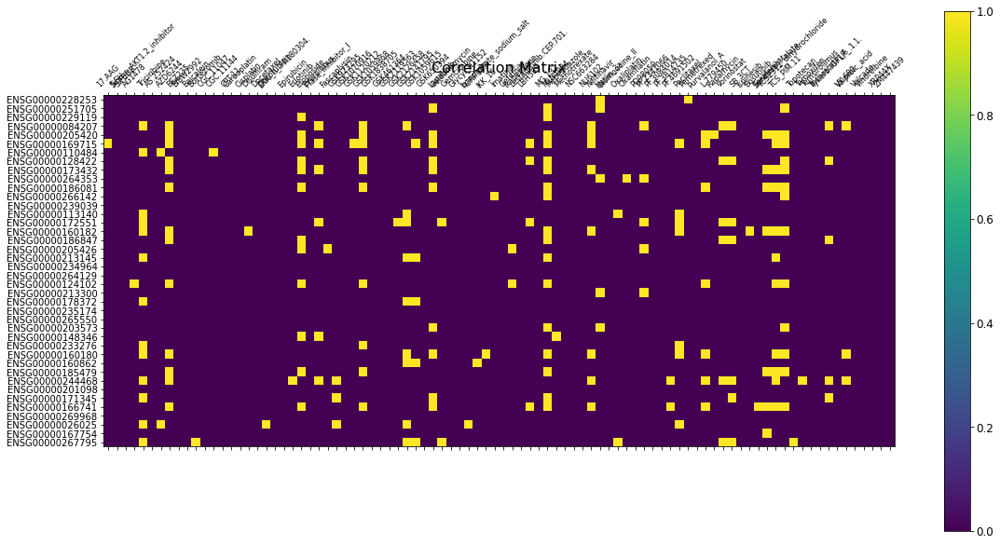

In [28]:
f = plt.figure(figsize=(19, 10))
#plt.matshow(dfcoeff.values, fignum=f.number)
plt.matshow(np.where(abs(dfcoeff.values) > threshold, 1, 0), fignum=f.number)
plt.xticks(range(dfcoeff.shape[1]), dfcoeff.columns, fontsize=8, rotation=45)
plt.yticks(range(dfcoeff.shape[0]), dfcoeff.index, fontsize=10)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=12)
plt.title('Correlation Matrix', fontsize=16);

In [0]:
G = nx.Graph()

In [0]:
#G.add_nodes_from(dfcoeff.columns, 
#                 #bipartite = 'drugs'
#                 )
#G.add_nodes_from(dfcoeff.index.tolist(), 
#                 #bipartite = 'genes'
#                 )

In [0]:
threshold = 0.35
for clmn in dfcoeff.columns:
    for idx in dfcoeff.index:
        #print (dfcoeff.loc[idx, clmn])
        if np.abs(dfcoeff.loc[idx, clmn]) > threshold:
            G.add_edge(idx, clmn, date = dfcoeff.loc[idx, clmn])

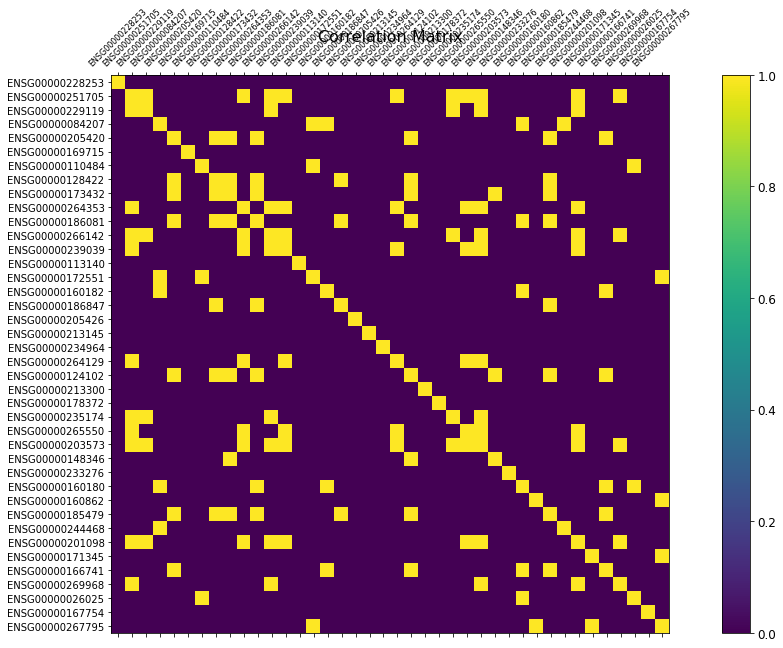

In [36]:
threshold2 = 0.65
f = plt.figure(figsize=(19, 10))
#plt.matshow(dfcoeff.values, fignum=f.number)
plt.matshow(np.where(abs(ExprData_selected.corr().values) > threshold2, 1, 0), fignum=f.number)
plt.xticks(range(ExprData_selected.shape[1]), ExprData_selected.columns, fontsize=8, rotation=45)
plt.yticks(range(ExprData_selected.shape[1]), ExprData_selected.columns, fontsize=10)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=12)
plt.title('Correlation Matrix', fontsize=16);


In [0]:
for cnt, clmn in enumerate(ExprData_selected.columns[:-1]):
    for idx in ExprData_selected.columns[cnt + 1:]:
        if np.abs(ExprData_selected.corr().loc[clmn, idx]) > threshold2:
            G.add_edge(idx, clmn, date = ExprData_selected.corr().loc[clmn, idx])

In [0]:
"""Girvan-Newman Clustering"""
def wrap_bw(H):
    bw = nx.edge_betweenness_centrality(H, normalized=False)
    mx = max(bw.values())
    for e in sorted(bw.keys()):
        if bw[e] == mx:
            return e

In [0]:
splits = list(nx.algorithms.community.centrality.girvan_newman(G, most_valuable_edge=wrap_bw))

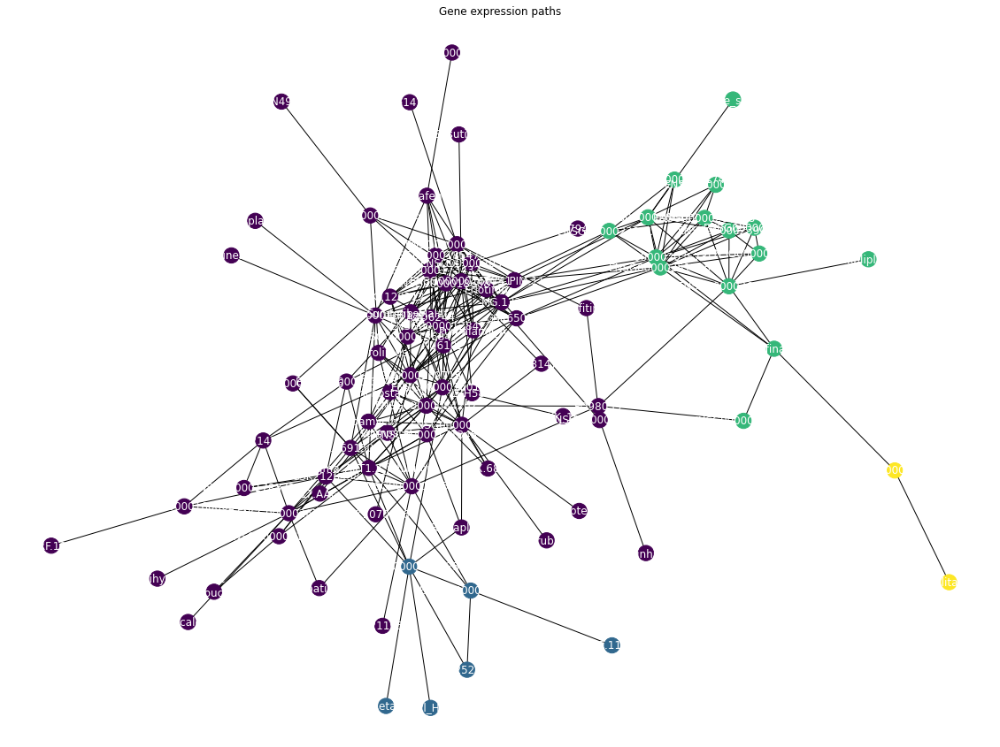

In [85]:
split_number = 2
color_map = {}
for i in range(len(splits[split_number])):
    for node in list(splits[split_number][i]):
        color_map[node] = i/len(splits[split_number])
        
values = [color_map.get(node, 0.25) for node in G.nodes()]
plt.figure(figsize=(20, 15))
plt.title("Gene expression paths")
nx.draw(G, 
        cmap=plt.get_cmap('viridis'), 
        node_color=values, 
        with_labels=True, 
        font_color='white')
plt.show()

In [0]:
for node in G.nodes():
    if node in dfcoeff.columns:
        G.nodes[node]['bipartite'] = 'drugs'
    else:
        G.nodes[node]['bipartite'] = 'genes'

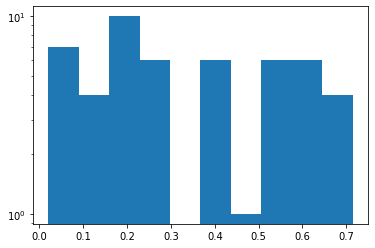

In [0]:
drugs_nodes = [n for n, d in G.nodes(data = True) if d['bipartite'] == 'drugs']
G_drugs = nx.bipartite.projected_graph(G, nodes = drugs_nodes)
dcs_drugs = nx.degree_centrality(G_drugs)
plt.hist(list(dcs_drugs.values()))
plt.yscale('log')
plt.show()

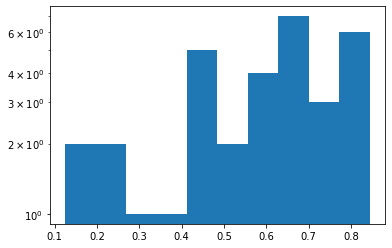

In [0]:
genes_nodes = [n for n, d in G.nodes(data = True) if d['bipartite'] == 'genes']
G_genes = nx.bipartite.projected_graph(G, nodes = genes_nodes)
dcs_genes = nx.degree_centrality(G_genes)
plt.hist(list(dcs_genes.values()))
plt.yscale('log')
plt.show()

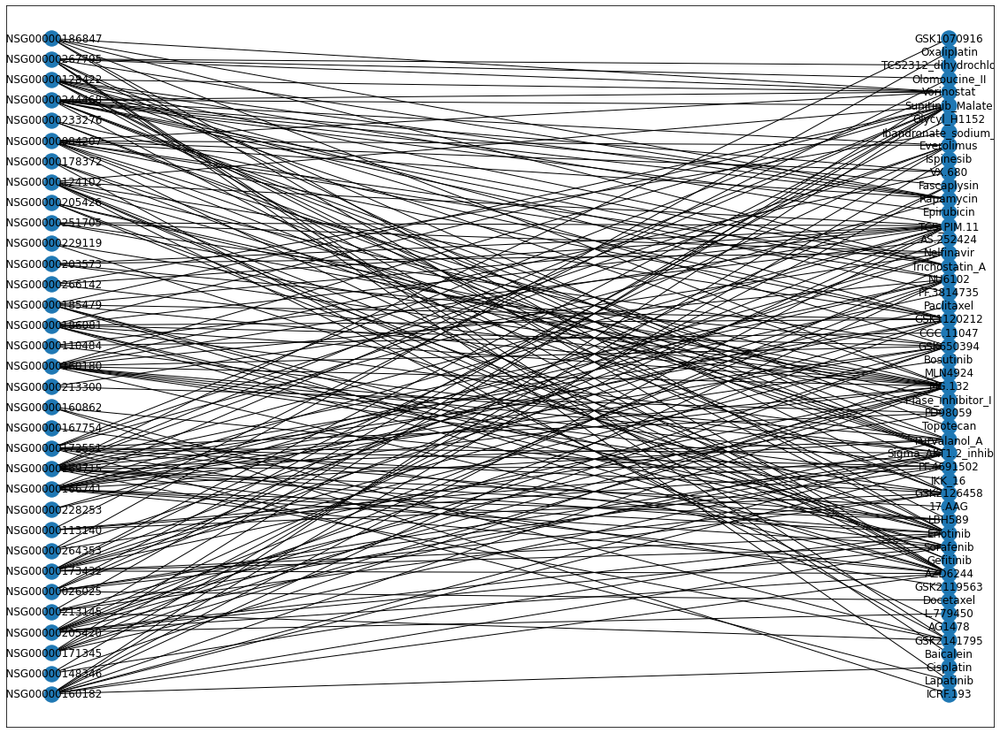

In [0]:
plt.figure(figsize=(20, 15))
#nx.draw(G,pos=nx.spring_layout(G), with_labels = True)
nx.draw_networkx(
    G,
    pos = nx.drawing.layout.bipartite_layout(G, 
                                             nodes = genes_nodes,
                                             scale = 1,
                                             align = 'vertical', 
                                             aspect_ratio = 4 / 3
                                             ), 
    #width = 1
    ) # Or whatever other display options you like

In [0]:
dcs = nx.bipartite.degree_centrality(G, nodes = genes_nodes)
for n, d in G.nodes(data=True):
    G.nodes[n]['dc'] = dcs[n]


###UMAP
First we make full dimensional visualization of gene expression with UMAP. 4 classes are identified.

In [0]:
plot_umap(ExprData_selected.join(ClinSubtypes, how = 'outer'),
          n_neighbors = 6, 
          min_dist = 0.05
          )

In [0]:
plot_umap(ExprData_selected.join(ClinSubtypes, how = 'outer'))